# NPS - CB1 - Machine learning 

# Setup
## Libraries

In [ ]:
# Data processing
import pandas as pd
import numpy as np
import pickle
import random

# Modelling
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score, ConfusionMatrixDisplay
from sklearn.utils.class_weight import compute_class_weight
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn import svm
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression



# Visualisation
import matplotlib.pyplot as plt
import math
import seaborn as sns
from matplotlib import colors as plt_colors
from IPython.display import Image

from rdkit import Chem
from rdkit.Chem.rdFingerprintGenerator import GetMorganGenerator
from rdkit.SimDivFilters import MaxMinPicker
from rdkit.Chem import rdDepictor,rdMolTransforms
import math
import shap

# Molpipeline
from molpipeline.abstract_pipeline_elements.mol2any.mol2bitvector import MolToFingerprintPipelineElement
from molpipeline import Pipeline
from molpipeline.any2mol import AutoToMol
from molpipeline.mol2any import MolToMorganFP
from molpipeline.experimental.explainability import SHAPTreeExplainer
from molpipeline.experimental.explainability import (
    structure_heatmap_shap,
)
from molpipeline.mol2mol import (
    ElementFilter,
    SaltRemover,
)

from rdkit_heatmaps import mapvalues2mol
from rdkit_heatmaps.utils import transform2png
from rdkit_heatmaps import get_depiction_limits
from IPython.display import display
from PIL import Image as PILImage
from PIL import Image
import io
from rdkit.Chem.Draw import MolDraw2DCairo


## Functions

In [ ]:
def diversity_train_test_split(df, strat_size=0.8, outcome='y'):
    mfpgen = GetMorganGenerator(radius=2, fpSize=2048)
    mmp = MaxMinPicker()

    selected_indices = []

    for label in df[outcome].unique():
        df_sub = df[df[outcome] == label].copy()
        
        fps = []
        mol_list = []
        idx_list = []

        for idx, row in df_sub.iterrows():
            mol = Chem.MolFromSmiles(row['smiles'])
            if mol is None:
                continue
            fp = mfpgen.GetFingerprint(mol)
            fps.append(fp)
            mol_list.append(mol)
            idx_list.append(idx)

        n_total = len(fps)
        n_pick = math.floor(strat_size * n_total)

        if n_total >= n_pick and n_pick > 0:
            idx_list = list(df_sub.index) 
            bv_ids = mmp.LazyBitVectorPick(fps, len(fps), n_pick)
            selected_indices.extend([idx_list[i] for i in bv_ids])

    selected_indices = list(selected_indices)

    remaining_indices = list(set(df.index) - set(selected_indices))

    X_train = df.loc[selected_indices].drop([outcome, 'smiles'], axis=1).copy()
    X_test = df.loc[remaining_indices].drop([outcome, 'smiles'], axis=1).copy()
    y_train = df.loc[selected_indices][outcome].copy()
    y_test = df.loc[remaining_indices][outcome].copy()
    
    le = preprocessing.LabelEncoder()
    le.fit(y_train)
    y_train=le.transform(y_train)
    y_test=le.transform(y_test)

    return X_train, X_test, y_train, y_test


def my_diverse_xgboost(df, model, my_index):
       
    X_train, X_test, y_train, y_test = diversity_train_test_split(df)
    
    classes = np.unique(y_train)
    cl_wght = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
    class_weight = {classes[i]: cl_wght[i] for i in range(len(classes))}
    
    sample_weights = np.array([class_weight[y] for y in y_train])
    
    xgb_model = xgb.XGBClassifier(objective="multi:softprob", random_state=42)
    xgb_model.fit(X_train, y_train, sample_weight = sample_weights)
    
    y_pred = xgb_model.predict(X_train)
    
    f1_train = f1_score(y_train, y_pred, average="weighted")
    precision_train = precision_score(y_train, y_pred, average="weighted")
    recall_train = recall_score(y_train, y_pred, average="weighted")
    
    y_pred = xgb_model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)

    ConfusionMatrixDisplay(confusion_matrix=cm).plot();
    
    f1_test = f1_score(y_test, y_pred, average="weighted")
    precision_test = precision_score(y_test, y_pred, average="weighted")
    recall_test = recall_score(y_test, y_pred, average="weighted")    

    df_result = pd.DataFrame([[model, f1_train, precision_train, recall_train, 
                           f1_test, precision_test, recall_test 
                           ]],  
                         columns=['model', 
                                  'f1_train', 'precision_train', 'recall_train',  
                                  'f1_test', 'precision_test', 'recall_test'
                                  ],
                         index=[my_index])  
    
    return df_result

def my_diverse_random_forest(df, model, my_index):
       
    X_train, X_test, y_train, y_test = diversity_train_test_split(df)
    
    cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)

    class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}
    
    rf = RandomForestClassifier(class_weight=class_weight)
    rf.fit(X_train, y_train)
    
    y_pred = rf.predict(X_train)
    
    f1_train = f1_score(y_train, y_pred, average="weighted")
    precision_train = precision_score(y_train, y_pred, average="weighted")
    recall_train = recall_score(y_train, y_pred, average="weighted")
    
    y_pred = rf.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)

    ConfusionMatrixDisplay(confusion_matrix=cm).plot();
    
    f1_test = f1_score(y_test, y_pred, average="weighted")
    precision_test = precision_score(y_test, y_pred, average="weighted")
    recall_test = recall_score(y_test, y_pred, average="weighted")

    df_result = pd.DataFrame([[model, f1_train, precision_train, recall_train, 
                           f1_test, precision_test, recall_test 
                           ]],  
                         columns=['model', 
                                  'f1_train', 'precision_train', 'recall_train',   
                                  'f1_test', 'precision_test', 'recall_test'
                                  ],
                         index=[my_index])   
    
    return df_result

def my_diverse_svm(df, model, my_index, scale=False):
    
    df = df.dropna(axis=0) 
       
    X_train, X_test, y_train, y_test = diversity_train_test_split(df)
    
    if scale:
      scaler = preprocessing.StandardScaler().fit(X_train)
      X_train = scaler.transform(X_train)
      X_test = scaler.transform(X_test)
    
    cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
    class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}
    
    mysvm = svm.SVC(decision_function_shape='ovo', class_weight=class_weight, probability=True)
    mysvm.fit(X_train, y_train)
    
    y_pred = mysvm.predict(X_train)

    f1_train = f1_score(y_train, y_pred, average="weighted")
    precision_train = precision_score(y_train, y_pred, average="weighted")
    recall_train = recall_score(y_train, y_pred, average="weighted")
    
    y_pred = mysvm.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)

    ConfusionMatrixDisplay(confusion_matrix=cm).plot();
    
    f1_test = f1_score(y_test, y_pred, average="weighted")
    precision_test = precision_score(y_test, y_pred, average="weighted")
    recall_test = recall_score(y_test, y_pred, average="weighted") 

    df_result = pd.DataFrame([[model, f1_train, precision_train, recall_train, 
                           f1_test, precision_test, recall_test 
                           ]],  
                         columns=['model', 
                                  'f1_train', 'precision_train', 'recall_train',  
                                  'f1_test', 'precision_test', 'recall_test'
                                  ],
                         index=[my_index])  
    
    return df_result

def my_diverse_mlp(df, model, my_index, scale=False):

    df = df.dropna(axis=0)
       
    X_train, X_test, y_train, y_test = diversity_train_test_split(df)
    
    if scale:
      scaler = preprocessing.StandardScaler().fit(X_train)
      X_train = scaler.transform(X_train)
      X_test = scaler.transform(X_test)
    
    cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)

    class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}
    
    params = {'hidden_layer_sizes' : [10,10],
          'activation' : 'relu', 'solver' : 'adam',
          'alpha' : 0.0, 'batch_size' : 10,
          'random_state' : 1,'tol' : 0.0001,
          'nesterovs_momentum' : False,
          'learning_rate' : 'constant',
          'learning_rate_init' : 0.01,
          'max_iter' : 1000, 'shuffle' : True,
          'n_iter_no_change' : 90, 'verbose' : False }

    net = MLPClassifier(**params)
    
    net.fit(X_train, y_train)
    
    y_pred = net.predict(X_train)
    
    f1_train = f1_score(y_train, y_pred, average="weighted")
    precision_train = precision_score(y_train, y_pred, average="weighted")
    recall_train = recall_score(y_train, y_pred, average="weighted")
    
    y_pred = net.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)

    ConfusionMatrixDisplay(confusion_matrix=cm).plot();
    
    f1_test = f1_score(y_test, y_pred, average="weighted")
    precision_test = precision_score(y_test, y_pred, average="weighted")
    recall_test = recall_score(y_test, y_pred, average="weighted") 

    df_result = pd.DataFrame([[model, f1_train, precision_train, recall_train, 
                           f1_test, precision_test, recall_test 
                           ]],  
                         columns=['model', 
                                  'f1_train', 'precision_train', 'recall_train',  
                                  'f1_test', 'precision_test', 'recall_test'
                                  ],
                         index=[my_index])  
    
    return df_result

def my_diverse_lr(df, model, my_index, scale=False):
    
    df = df.dropna(axis=0)
       
    X_train, X_test, y_train, y_test = diversity_train_test_split(df)
    
    if scale:
      scaler = preprocessing.StandardScaler().fit(X_train)
      X_train = scaler.transform(X_train)
      X_test = scaler.transform(X_test)
    
    cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
    class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}
    
    lr = LogisticRegression(solver='lbfgs', class_weight=class_weight, random_state=42, max_iter=1000)
    lr.fit(X_train, y_train)
    
    y_pred = lr.predict(X_train)    
    f1_train = f1_score(y_train, y_pred, average="weighted")
    precision_train = precision_score(y_train, y_pred, average="weighted")
    recall_train = recall_score(y_train, y_pred, average="weighted")
    
    y_pred = lr.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    ConfusionMatrixDisplay(confusion_matrix=cm).plot();
    
    f1_test = f1_score(y_test, y_pred, average="weighted")
    precision_test = precision_score(y_test, y_pred, average="weighted")
    recall_test = recall_score(y_test, y_pred, average="weighted") 

    df_result = pd.DataFrame([[model, f1_train, precision_train, recall_train,
                           f1_test, precision_test, recall_test 
                           ]],  
                         columns=['model', 
                                  'f1_train', 'precision_train', 'recall_train',  
                                  'f1_test', 'precision_test', 'recall_test'
                                  ],
                         index=[my_index])  
    
    return df_result


def shuffle(x):
    x = list(x)
    random.shuffle(x)
    return x


# Binding affinity (Ki)
## Import datasets

In [ ]:
    
with open("dataframes_cb1_ki.pkl", "rb") as f:
    loaded = pickle.load(f)

df_ki = loaded["df_ki"]
df_maccs = loaded["df_maccs"]
df_ecfp = loaded["df_ecfp"]
df_kr = loaded["df_kr"]

## Model comparison

### XGBoost

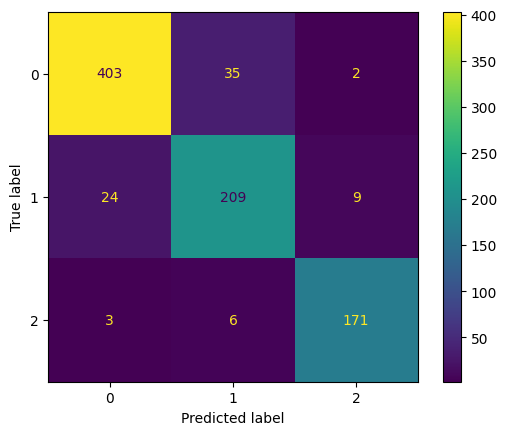

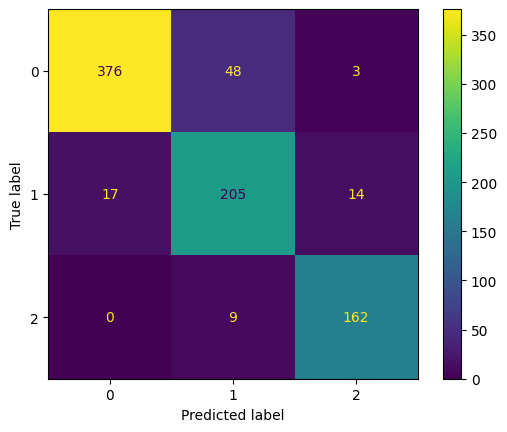

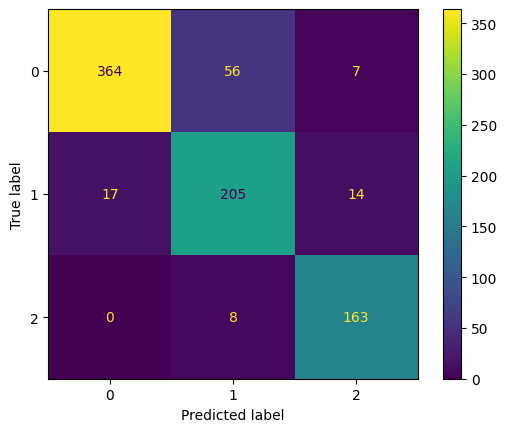

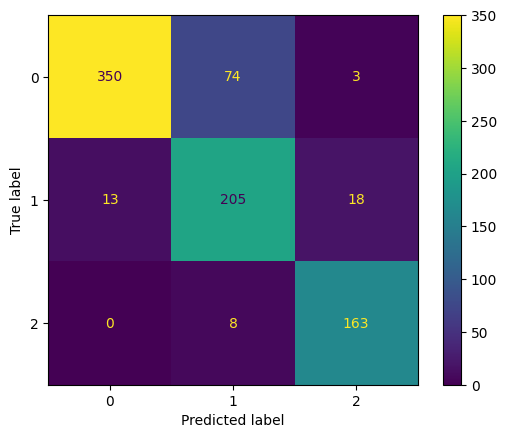

In [5]:
df_1 = my_diverse_xgboost(df_ki, 'padel', 'XGBoost')
df_2 = my_diverse_xgboost(df_ecfp, 'ecfp', 'XGBoost')
df_3 = my_diverse_xgboost(df_maccs, 'maccs', 'XGBoost')
df_4 = my_diverse_xgboost(df_kr, 'KlekotaRoth', 'XGBoost')

df_final_xgb = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Random Forest

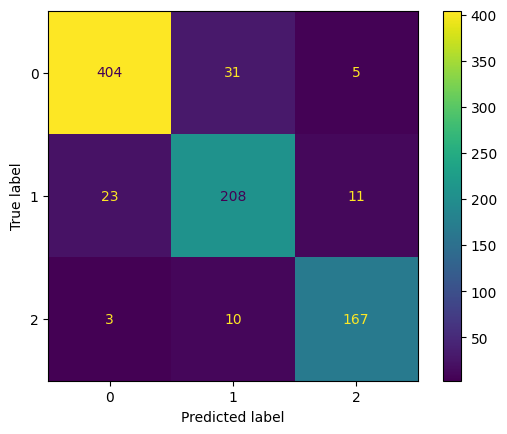

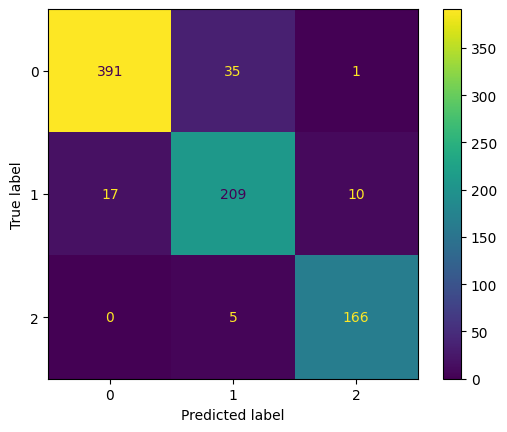

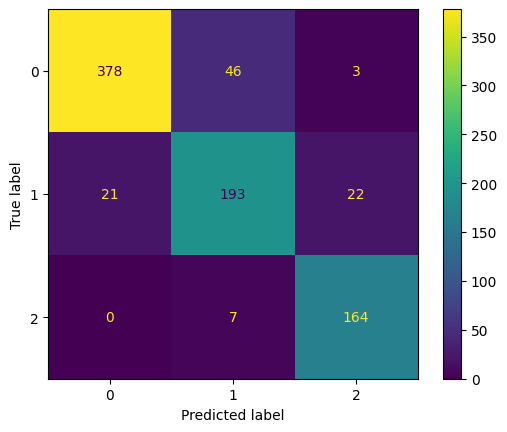

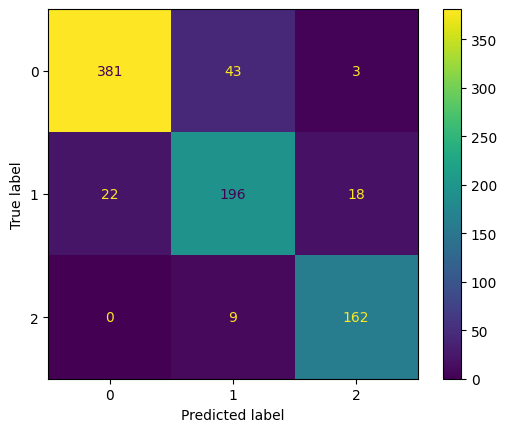

In [6]:
df_1 = my_diverse_random_forest(df_ki, 'padel', 'RandomForest')
df_2 = my_diverse_random_forest(df_ecfp, 'ecfp', 'RandomForest')
df_3 = my_diverse_random_forest(df_maccs, 'maccs', 'RandomForest')
df_4 = my_diverse_random_forest(df_kr, 'KlekotaRoth', 'RandomForest')

df_final_rf = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### SVM

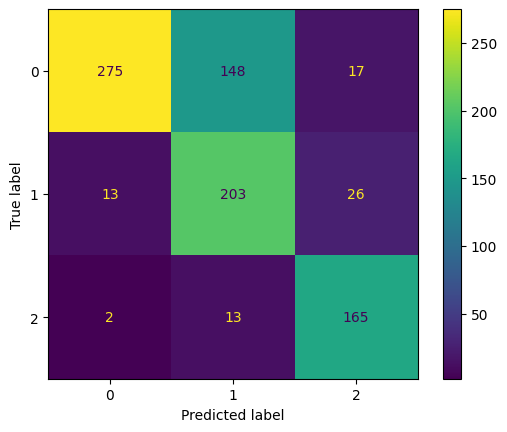

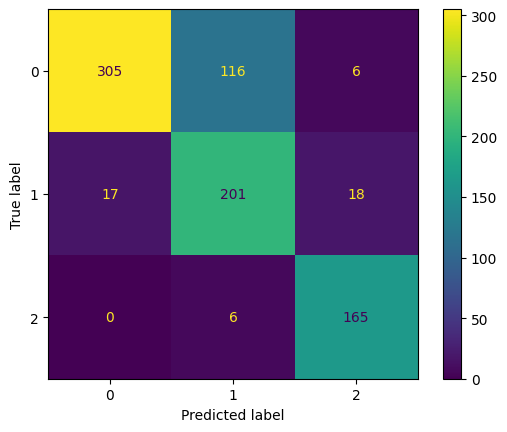

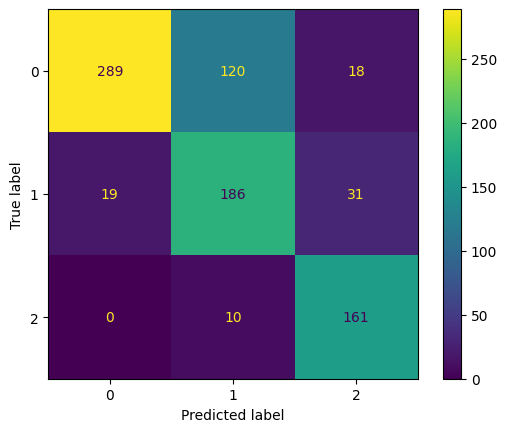

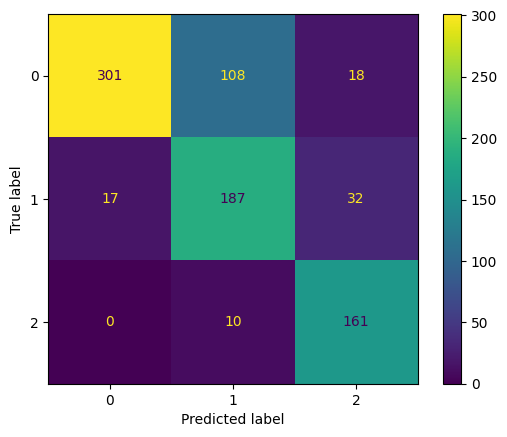

In [7]:
df_1 = my_diverse_svm(df_ki, 'padel', 'SVM', scale=True)
df_2 = my_diverse_svm(df_ecfp, 'ecfp', 'SVM')
df_3 = my_diverse_svm(df_maccs, 'maccs', 'SVM')
df_4 = my_diverse_svm(df_kr, 'KlekotaRoth', 'SVM')

df_final_svm = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### MLP

c:\Users\i0329119\AppData\Local\anaconda3\envs\sklearn\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:785: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


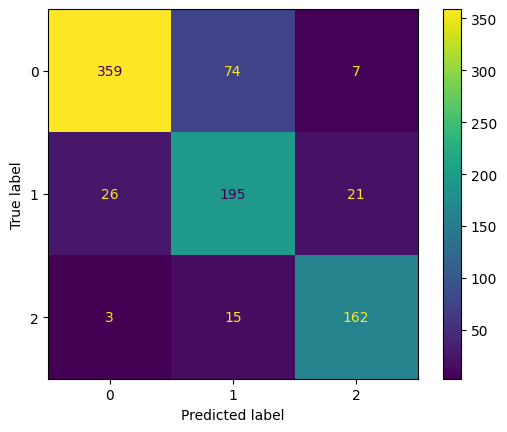

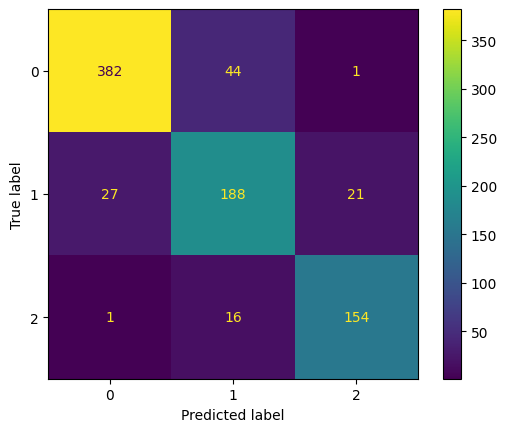

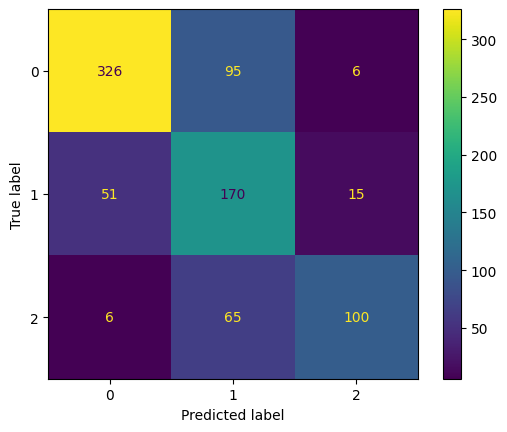

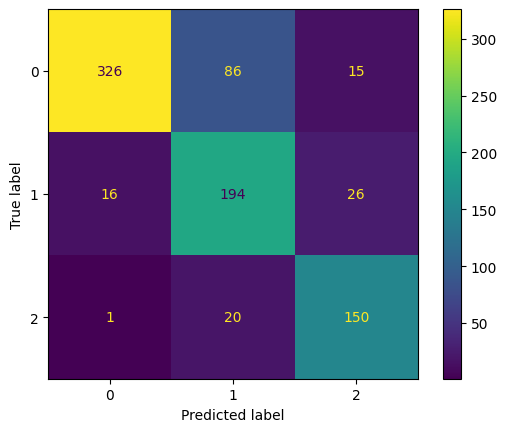

In [8]:
df_1 = my_diverse_mlp(df_ki, 'padel', 'MLP', scale=True)
df_2 = my_diverse_mlp(df_ecfp, 'ecfp', 'MLP')
df_3 = my_diverse_mlp(df_maccs, 'maccs', 'MLP')
df_4 = my_diverse_mlp(df_kr, 'KlekotaRoth', 'MLP')

df_final_mlp = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Logistic regression

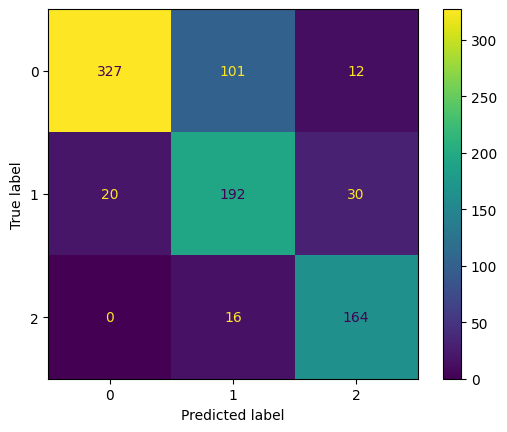

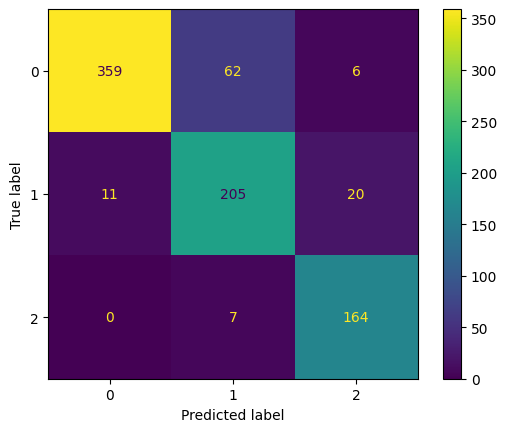

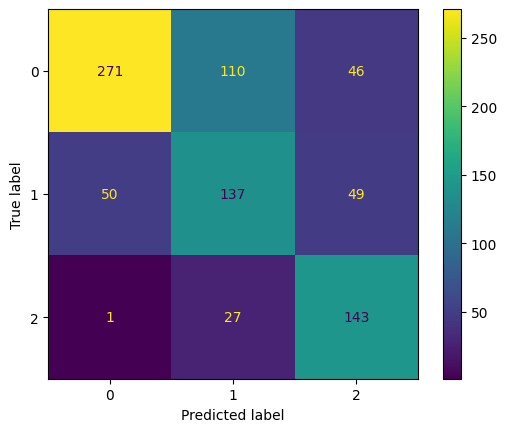

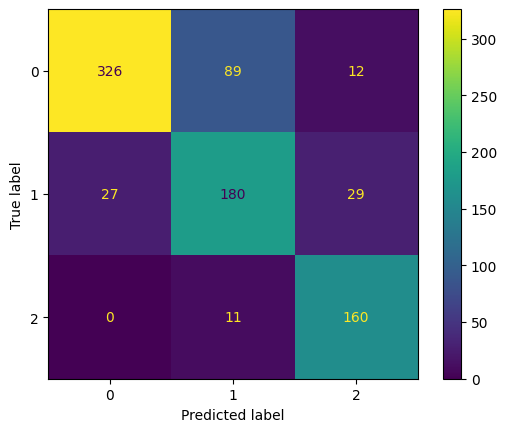

In [9]:
df_1 = my_diverse_lr(df_ki, 'padel', 'LR', scale=True)
df_2 = my_diverse_lr(df_ecfp, 'ecfp', 'LR')
df_3 = my_diverse_lr(df_maccs, 'maccs', 'LR')
df_4 = my_diverse_lr(df_kr, 'KlekotaRoth', 'LR')

df_final_lr = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Combine

In [10]:
df_final_models = pd.concat([df_final_xgb, df_final_rf, df_final_svm, df_final_mlp, df_final_lr])

## y-randomization

In [11]:
df_ki_rand = df_ki
df_ki_rand['y'] = shuffle(df_ki["y"])

df_maccs_rand = df_maccs
df_maccs_rand['y'] = shuffle(df_maccs["y"])

df_ecfp_rand = df_ecfp
df_ecfp_rand['y'] = shuffle(df_ecfp["y"])

df_kr_rand = df_kr
df_kr_rand['y'] = shuffle(df_kr["y"])

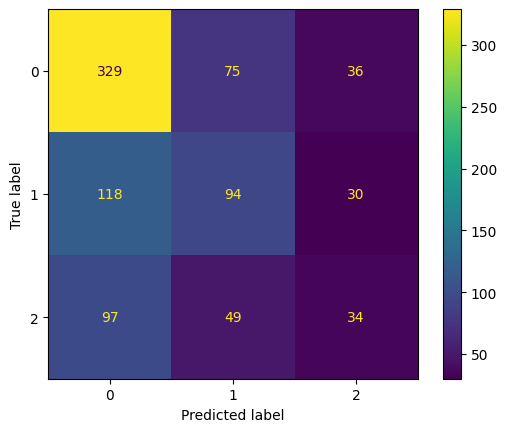

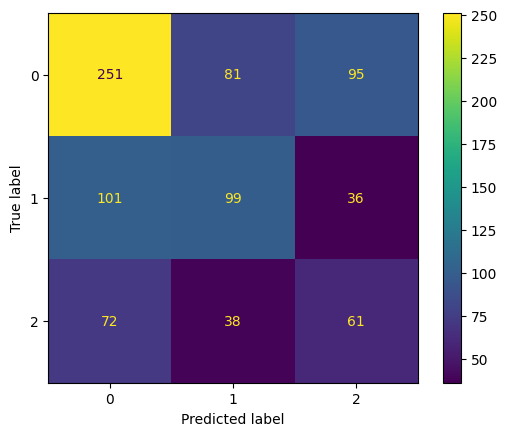

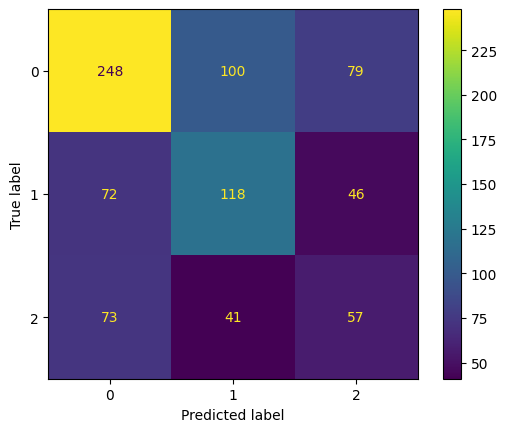

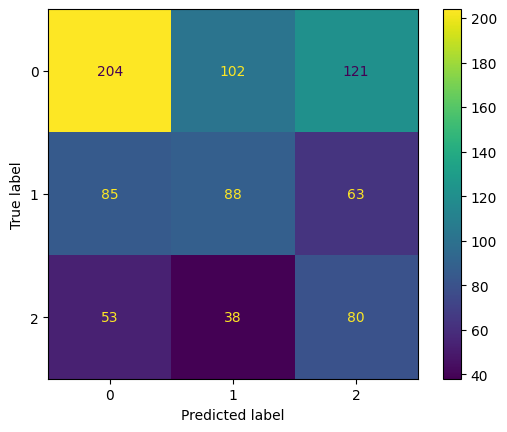

In [12]:
df_1 = my_diverse_xgboost(df_ki_rand, 'padel', 'XGBoost')
df_2 = my_diverse_xgboost(df_ecfp_rand, 'ecfp', 'XGBoost')
df_3 = my_diverse_xgboost(df_maccs_rand, 'maccs', 'XGBoost')
df_4 = my_diverse_xgboost(df_kr_rand, 'KlekotaRoth', 'XGBoost')

df_final_xgb = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

## SHAP

In [13]:
with open("model_ki_xgb_ki.pkl", "rb") as f:
    loaded = pickle.load(f)

model = loaded["model"]
X_train = loaded["X_train"]
X_test = loaded["X_test"]
y_train = loaded["y_train"]
y_test = loaded["y_test"]
label_encoder = loaded["label_encoder"]

C:\Users\i0329119\AppData\Local\Temp\ipykernel_27020\1063684483.py:2: UserWarning: [16:19:46] WARNING: C:\miniconda3\conda-bld\xgboost-split_1764761400759\work\src\gbm\../common/error_msg.h:83: If you are loading a serialized model (like pickle in Python, RDS in R) or
configuration generated by an older version of XGBoost, please export the model by calling
`Booster.save_model` from that version first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/stable/tutorials/saving_model.html

for more details about differences between saving model and serializing.

  loaded = pickle.load(f)
c:\Users\i0329119\AppData\Local\anaconda3\envs\sklearn\Lib\site-packages\sklearn\base.py:463: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.7.2 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#securi

In [14]:

explainer = shap.Explainer(model, X_train, algorithm="tree")
shap_values = explainer(X_test)

 98%|===================| 2541/2586 [00:35<00:00]        

### Summary Plot

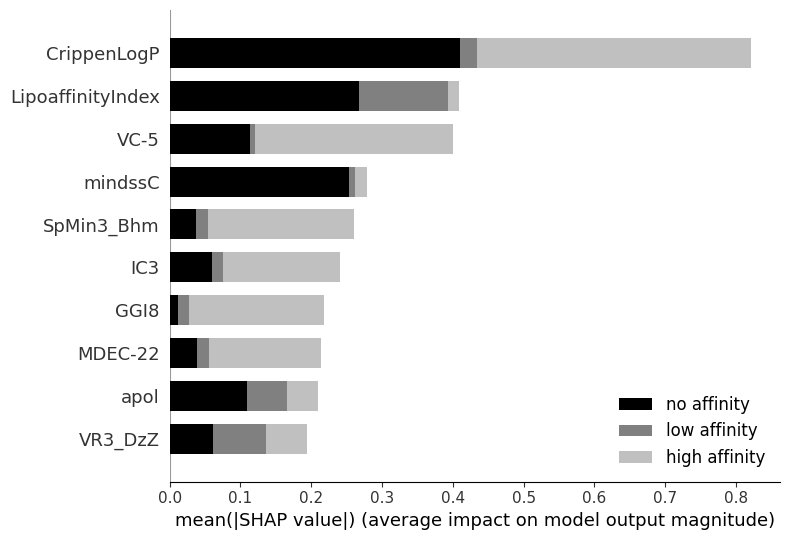

In [15]:
colors = ["silver", "gray", "black"]
classes = ["no affinity", "low affinity", "high affinity"]

class_inds = np.argsort(classes)

cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])

shap.summary_plot(shap_values, X_test.values, max_display=10, class_names=["no affinity", "low affinity", "high affinity"], class_inds=[0, 1, 2], plot_type="bar", 
                  color = cmap, show=False)



### Beeswarm

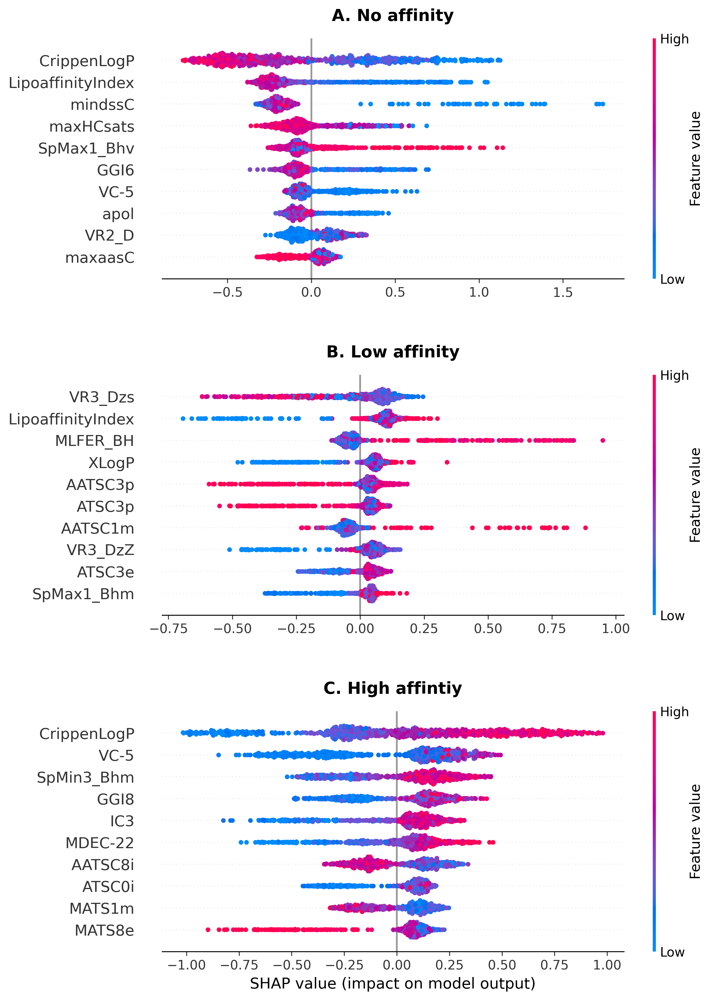

In [16]:
shap_values_class0 = shap_values[:, :, 0]  
shap_values_class1 = shap_values[:, :, 1] 
shap_values_class2 = shap_values[:, :, 2] 

my_classes = [shap_values_class0, shap_values_class1, shap_values_class2]
titles = ["A. No affinity", "B. Low affinity", "C. High affintiy"]

fig, axes = plt.subplots(3, 1, figsize=(9, 12), dpi=300)

for i, (ax, expl, title) in enumerate(zip(axes, my_classes, titles)):
    shap.plots.beeswarm(
        expl,
        max_display=10,
        group_remaining_features=False,
        show=False,
        plot_size=None, 
        ax=ax     
    )
    ax.set_title(title, loc="center", pad=15, fontweight="bold", fontsize=14)
    
    if i < len(axes) - 1:
        ax.set_xlabel("") 

plt.tight_layout()

plt.subplots_adjust(hspace=0.4)

plt.show()

## SHAP heatmap

In [17]:

df_ecfp_h = pickle.load( open( "df_heatmap_ki.pkl", "rb" ) )

X = df_ecfp_h['smiles'].copy()
y = df_ecfp_h['y'].copy()

le = preprocessing.LabelEncoder()
le.fit(y)
y=le.transform(y)

cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y), y=y)

class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}

pipeline = Pipeline([
    ("auto2mol", AutoToMol()),
    ("morgan3_2048", MolToMorganFP(n_bits=2048, radius=3)),
    ("RandomForest", RandomForestClassifier(random_state=42, class_weight=class_weight))
],
    n_jobs=4)

pipeline.fit(X, y)

,steps,"[('auto2mol', ...), ('morgan3_2048', ...), ...]"
,memory,None
,verbose,False
,n_jobs,4
,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'


### Functions

In [18]:

def plot_molecule_shap2(mol, pipeline=pipeline, pad=12, value_lims=None):

    explainer = SHAPTreeExplainer(pipeline)
    explanations = explainer.explain([mol], check_additivity=False)
    exp = explanations[0]

    atom_weights = exp.atom_weights

    if value_lims is None:
        local_min = atom_weights.min()
        local_max = atom_weights.max()
        local_abs = max(abs(local_min), abs(local_max))
        value_lims = [-local_abs, local_abs]

    canvas = mapvalues2mol(mol, atom_weights, value_lims=value_lims)
    img = transform2png(canvas.GetDrawingText())

    buf = io.BytesIO()
    img.save(buf, format="PNG")
    cropped = crop_to_content(buf.getvalue(), pad=pad)

    pred_class = pipeline.predict([mol])[0]
    proba = pipeline.predict_proba([mol])[0]
    confidence = proba[pred_class] * 100

    class_map = {
        1: "High affinity",
        2: "Low affinity",
        0: "No affinity"
    }
    pred_label = class_map.get(pred_class, str(pred_class))

    fw = exp.feature_weights
    class_feat_shap = fw[:, pred_class].sum()

    return cropped, pred_label, confidence, class_feat_shap


def crop_to_content(png_bytes, pad=15, white_threshold=250):

    img = Image.open(io.BytesIO(png_bytes)).convert("RGBA")
    arr = np.asarray(img)
    alpha = arr[:, :, 3]
    rgb = arr[:, :, :3]

    content_mask = (alpha > 0) & (np.any(rgb < white_threshold, axis=2))

    if not content_mask.any():
        return img 

    ys, xs = np.where(content_mask)
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()

    x0 = max(x0 - pad, 0)
    y0 = max(y0 - pad, 0)
    x1 = min(x1 + pad, img.width - 1)
    y1 = min(y1 + pad, img.height - 1)

    return img.crop((x0, y0, x1 + 1, y1 + 1))


### Combined plot

In [19]:
df_simis = pd.read_csv('cb1_similarity_substances.csv', sep=";")

pretty_names = {
    "JWH_018": "JWH-018",
    "2_OH_indole_JWH_018": "2-OH indole JWH-018",
    "4_OH_indole_JWH_018": "4-OH indole JWH-018",
    "5_OH_indole_JWH_018": "5-OH indole JWH-018",
    "6_OH_indole_JWH_018": "6-OH indole JWH-018",
    "7_OH_indole_JWH_018": "7-OH indole JWH-018",
    "4_OH_pentyl_JWH_018" : "4-OH pentyl JWH-018", 
    "5_OH_pentyl_JWH_018" : "5-OH pentyl JWH-018", 
    "N_Pentanoic_acid_JWH_018" : "N-Pentanoic acid JWH-018",
    "THJ_2201": "THJ-2201", 
    "AM_2201" : "AM-2201", 
    "THJ_018" : "THJ-018"
}


In [20]:
mols = [Chem.MolFromSmiles(s) for s in df_simis["smiles"]]
for mol, name in zip(mols, df_simis["names"]):
    mol.SetProp("names", str(name))

explainer = SHAPTreeExplainer(pipeline)
explanations = explainer.explain(mols, check_additivity=False)

explanations_dict = {exp.molecule.GetProp("names"): exp for exp in explanations}

weight_min = min(exp.atom_weights.min() for exp in explanations_dict.values())
weight_max = max(exp.atom_weights.max() for exp in explanations_dict.values())
weight_abs_max = max(abs(weight_min), abs(weight_max))

weight_abs_max *= 0.70

global_limits = [-weight_abs_max, weight_abs_max]

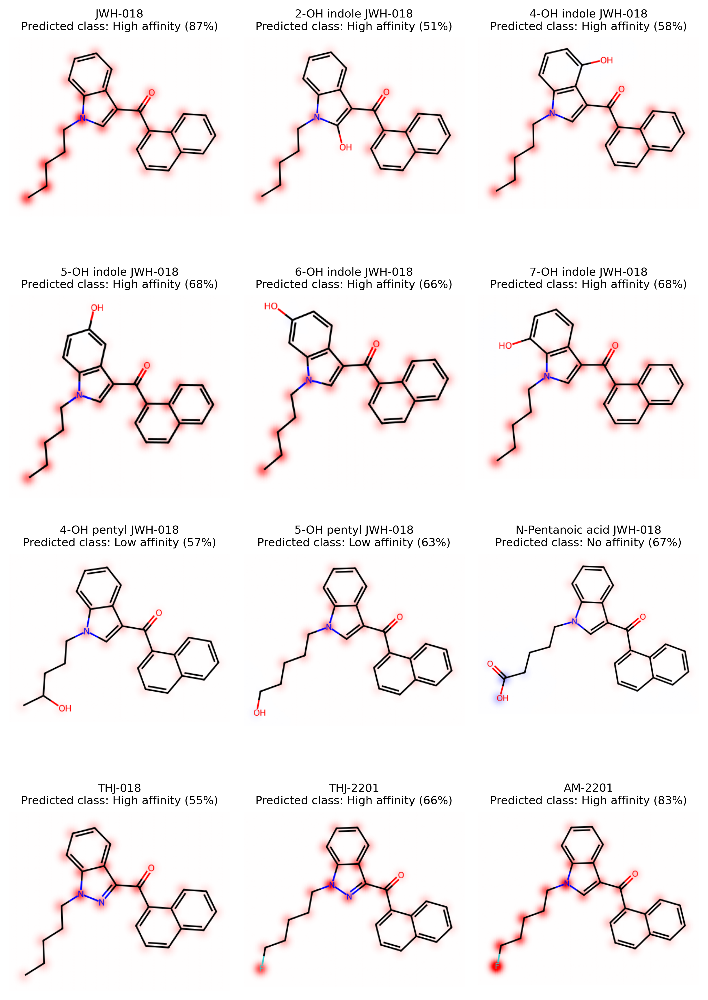

In [21]:

rotate = ["5_OH_pentyl_JWH_018", "N_Pentanoic_acid_JWH_018","THJ_2201", "AM_2201"]

mols = {}
rot_y = np.array([[-1.,0.,0.,0.],[0.,1.,0.,0.],[0.,0.,-1.,0.],[0.,0.,0.,1.]])

for smi, name in zip(df_simis["smiles"], df_simis["names"]):
    mol = Chem.MolFromSmiles(smi)
    mol.SetProp("names", str(name))

    rdDepictor.Compute2DCoords(mol)

    if name in rotate:
        rdMolTransforms.TransformConformer(mol.GetConformer(0), rot_y)

    mols[name] = mol

imgs, preds, confs, feat_w = zip(*[plot_molecule_shap2(mols[name], pipeline, value_lims=global_limits) for name in df_simis["names"]])

fig, axes = plt.subplots(4, 3, figsize=(8, 12), dpi=400)
axes = axes.ravel()

for ax, img, name, pred, conf, feat_w  in zip(axes, imgs, df_simis["names"], preds, confs, feat_w ):
    ax.imshow(img)
    ax.axis("off")
    pretty = pretty_names.get(name, name) 
    ax.set_title(f"{pretty}\nPredicted class: {pred} ({conf:.0f}%)", fontsize=9, loc="center")
    ax.set_anchor("N")

plt.tight_layout()

plt.show()

# Functional potency (EC50)
## Import datasets

In [22]:
   
with open("dataframes_cb1_ec50.pkl", "rb") as f:
    loaded = pickle.load(f)

df_ki = loaded["df_ki"]
df_maccs = loaded["df_maccs"]
df_ecfp = loaded["df_ecfp"]
df_kr = loaded["df_kr"]

## Model comparison

### XGB

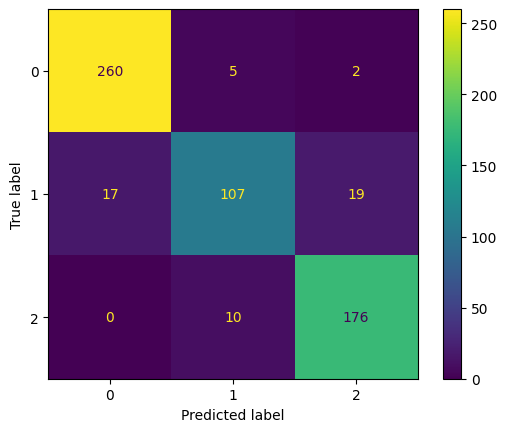

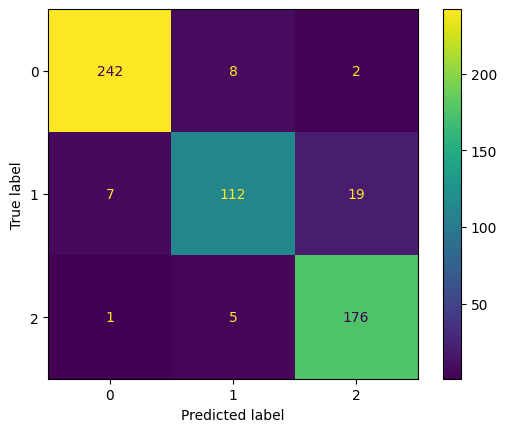

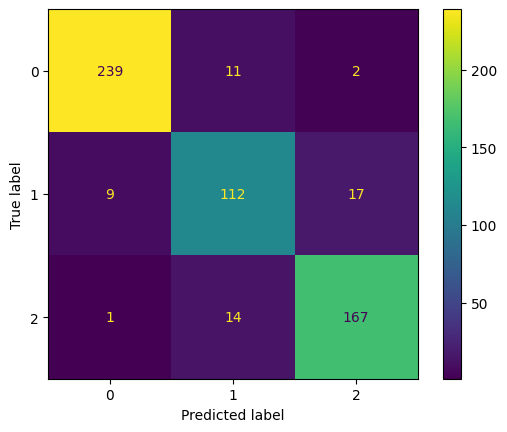

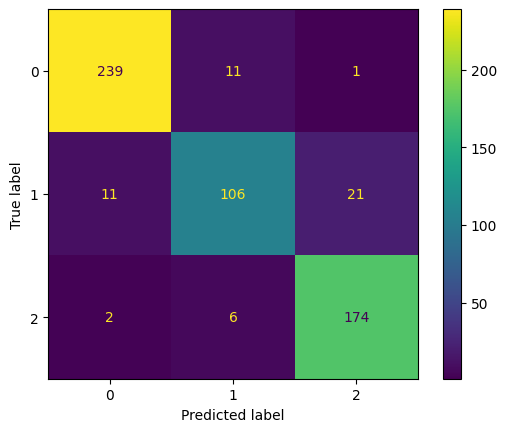

In [23]:
df_1 = my_diverse_xgboost(df_ki, 'padel', 'XGBoost')
df_2 = my_diverse_xgboost(df_ecfp, 'ecfp', 'XGBoost')
df_3 = my_diverse_xgboost(df_maccs, 'maccs', 'XGBoost')
df_4 = my_diverse_xgboost(df_kr, 'KlekotaRoth', 'XGBoost')

df_final_xgb = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Random Forest

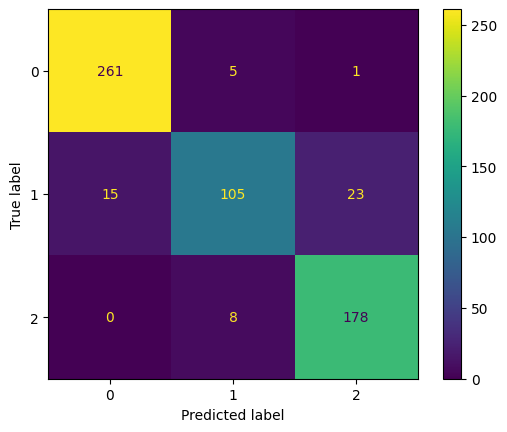

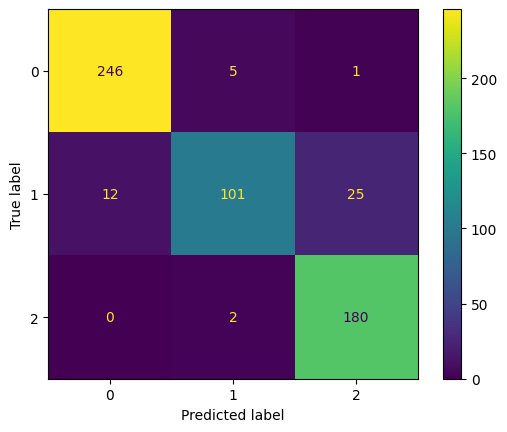

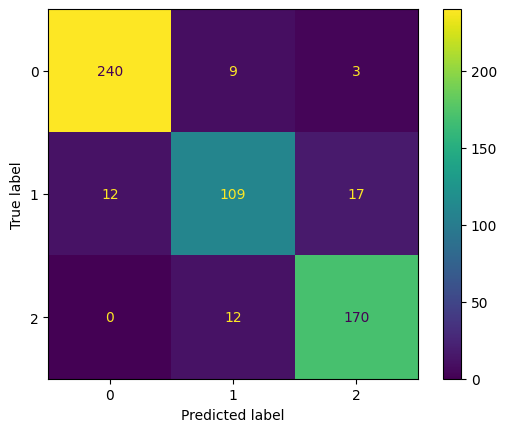

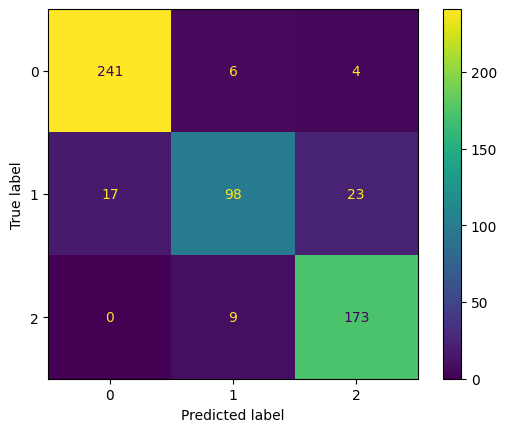

In [24]:
df_1 = my_diverse_random_forest(df_ki, 'padel', 'RandomForest')
df_2 = my_diverse_random_forest(df_ecfp, 'ecfp', 'RandomForest')
df_3 = my_diverse_random_forest(df_maccs, 'maccs', 'RandomForest')
df_4 = my_diverse_random_forest(df_kr, 'KlekotaRoth', 'RandomForest')

df_final_rf = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### SVM

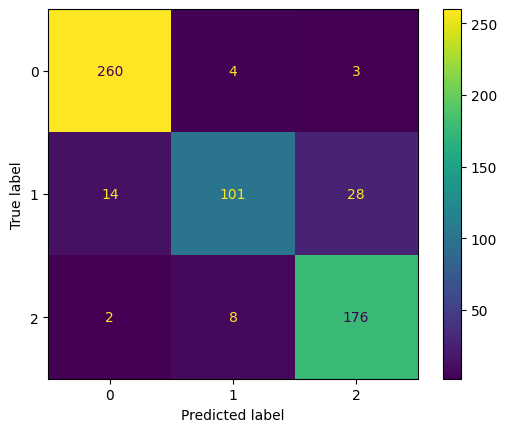

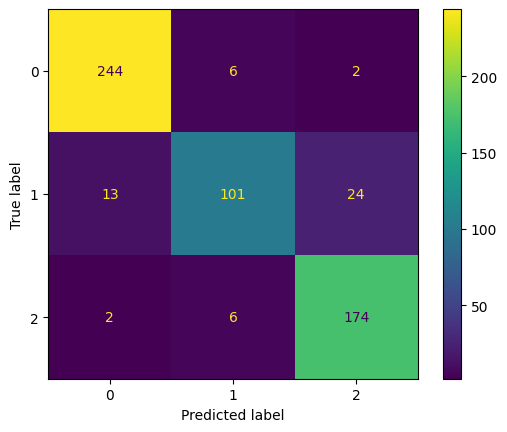

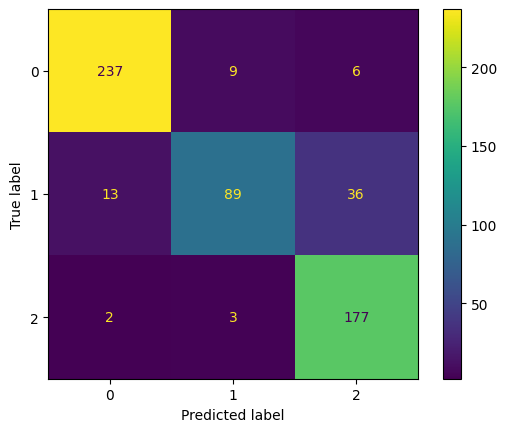

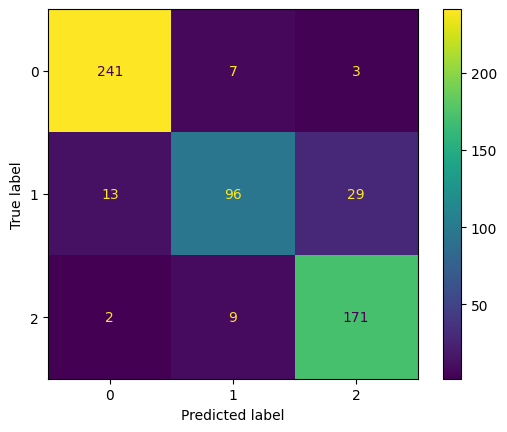

In [25]:
df_1 = my_diverse_svm(df_ki, 'padel', 'SVM', scale=True)
df_2 = my_diverse_svm(df_ecfp, 'ecfp', 'SVM')
df_3 = my_diverse_svm(df_maccs, 'maccs', 'SVM')
df_4 = my_diverse_svm(df_kr, 'KlekotaRoth', 'SVM')

df_final_svm = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### MLP

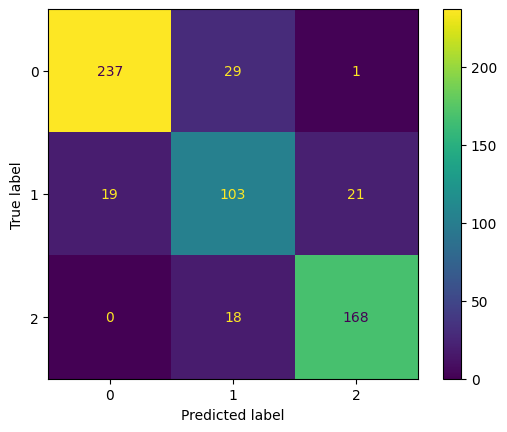

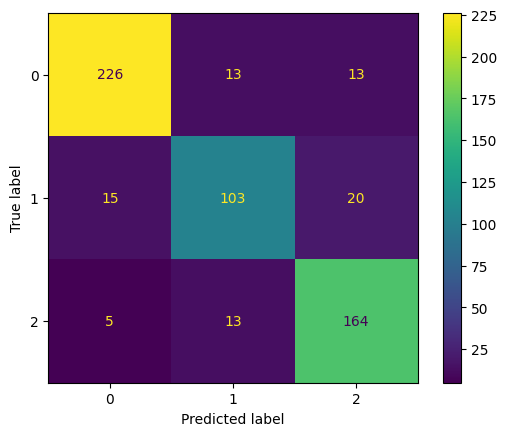

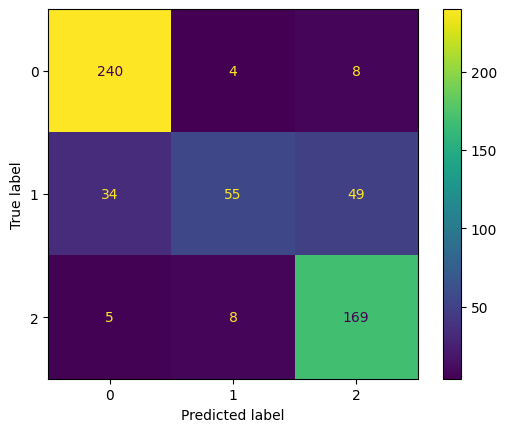

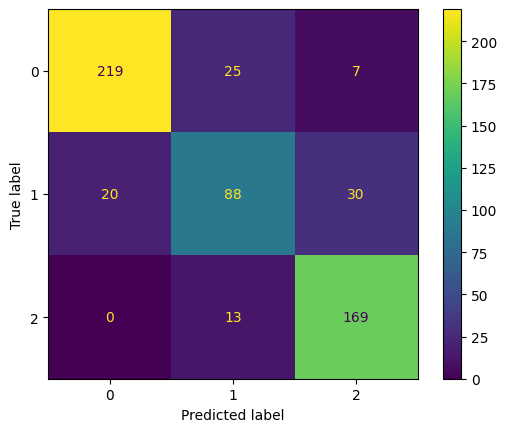

In [26]:
df_1 = my_diverse_mlp(df_ki, 'padel', 'MLP', scale=True)
df_2 = my_diverse_mlp(df_ecfp, 'ecfp', 'MLP')
df_3 = my_diverse_mlp(df_maccs, 'maccs', 'MLP')
df_4 = my_diverse_mlp(df_kr, 'KlekotaRoth', 'MLP')

df_final_mlp = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Logistic regression

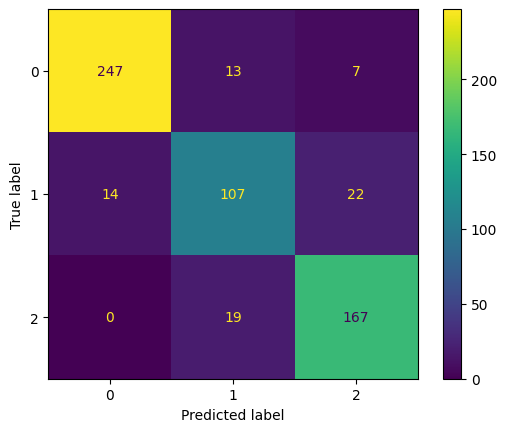

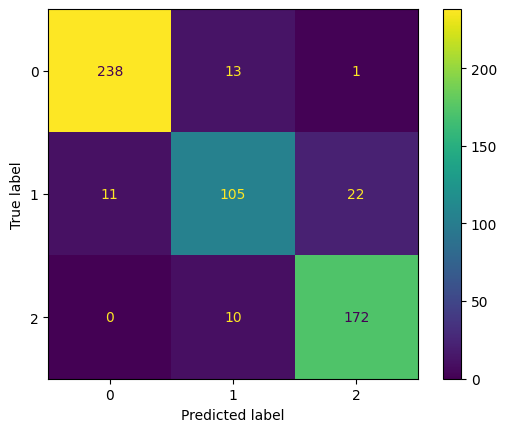

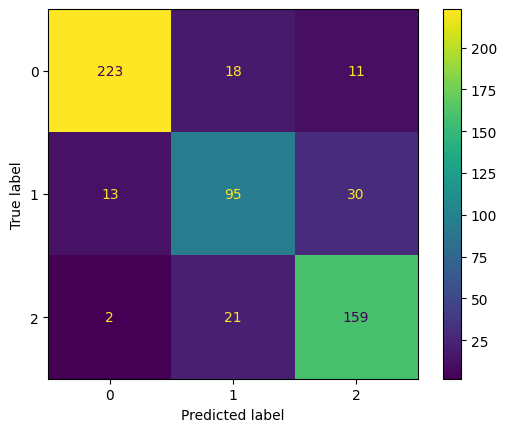

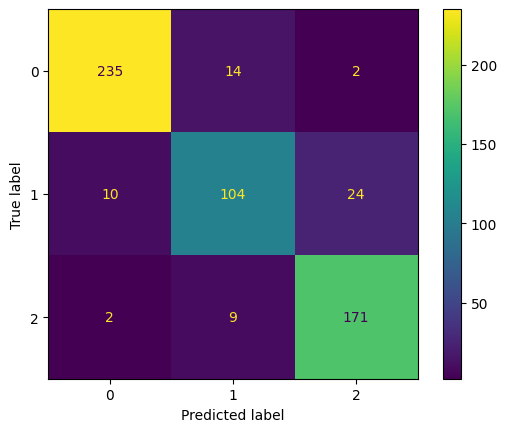

In [27]:
df_1 = my_diverse_lr(df_ki, 'padel', 'LR', scale=True)
df_2 = my_diverse_lr(df_ecfp, 'ecfp', 'LR')
df_3 = my_diverse_lr(df_maccs, 'maccs', 'LR')
df_4 = my_diverse_lr(df_kr, 'KlekotaRoth', 'LR')

df_final_lr = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

### Combine

In [28]:
df_final_models = pd.concat([df_final_xgb, df_final_rf, df_final_svm, df_final_mlp, df_final_lr])

## y-randomization

In [29]:
df_ki_rand = df_ki
df_ki_rand['y'] = shuffle(df_ki["y"])

df_maccs_rand = df_maccs
df_maccs_rand['y'] = shuffle(df_maccs["y"])

df_ecfp_rand = df_ecfp
df_ecfp_rand['y'] = shuffle(df_ecfp["y"])

df_kr_rand = df_kr
df_kr_rand['y'] = shuffle(df_kr["y"])

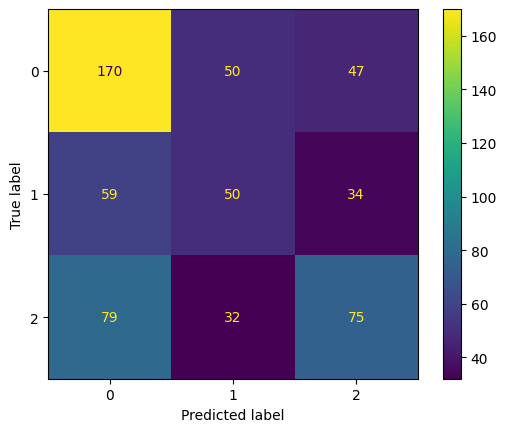

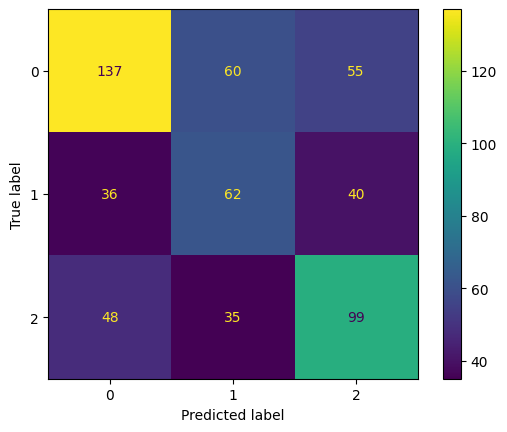

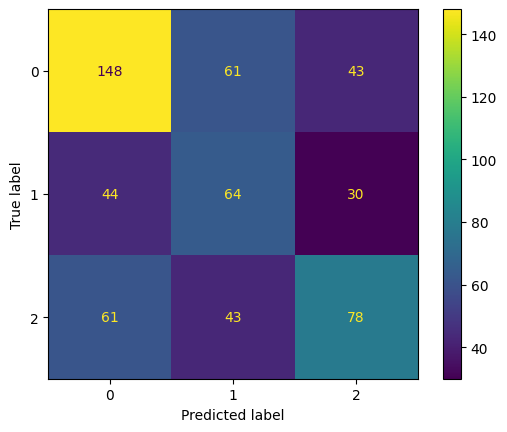

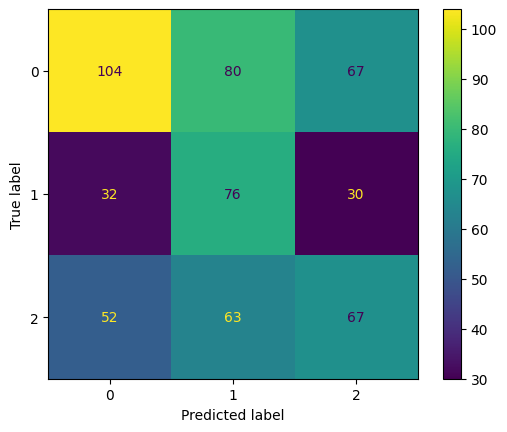

In [30]:
df_1 = my_diverse_xgboost(df_ki_rand, 'padel', 'XGBoost')
df_2 = my_diverse_xgboost(df_ecfp_rand, 'ecfp', 'XGBoost')
df_3 = my_diverse_xgboost(df_maccs_rand, 'maccs', 'XGBoost')
df_4 = my_diverse_xgboost(df_kr_rand, 'KlekotaRoth', 'XGBoost')

df_final_xgb = pd.concat([df_1, df_2, df_3, df_4])

del df_1, df_2, df_3, df_4

## SHAP

In [31]:
with open("model_ki_xgb_ec50.pkl", "rb") as f:
    loaded = pickle.load(f)

model = loaded["model"]
X_train = loaded["X_train"]
X_test = loaded["X_test"]
y_train = loaded["y_train"]
y_test = loaded["y_test"]
label_encoder = loaded["label_encoder"]

c:\Users\i0329119\AppData\Local\anaconda3\envs\sklearn\Lib\site-packages\sklearn\base.py:463: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.7.2 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [32]:
import shap

explainer = shap.Explainer(model, X_train, algorithm="tree")
shap_values = explainer(X_test)

 95%|=================== | 1699/1788 [00:18<00:00]       

### Summary plot

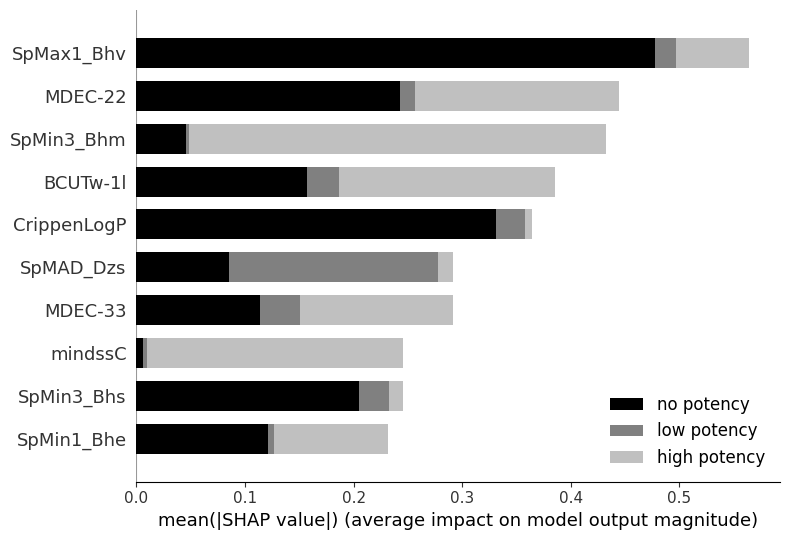

In [33]:

colors = ["silver", "gray", "black"]
classes = ["no potency", "low potency", "high potency"]
class_inds = np.argsort(classes)

cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])

shap.summary_plot(shap_values, X_test.values, max_display=10, class_names=["no potency", "low potency", "high potency"], 
                  class_inds=[0, 1, 2], plot_type="bar", 
                  color = cmap, show=False)



### Beeswarm

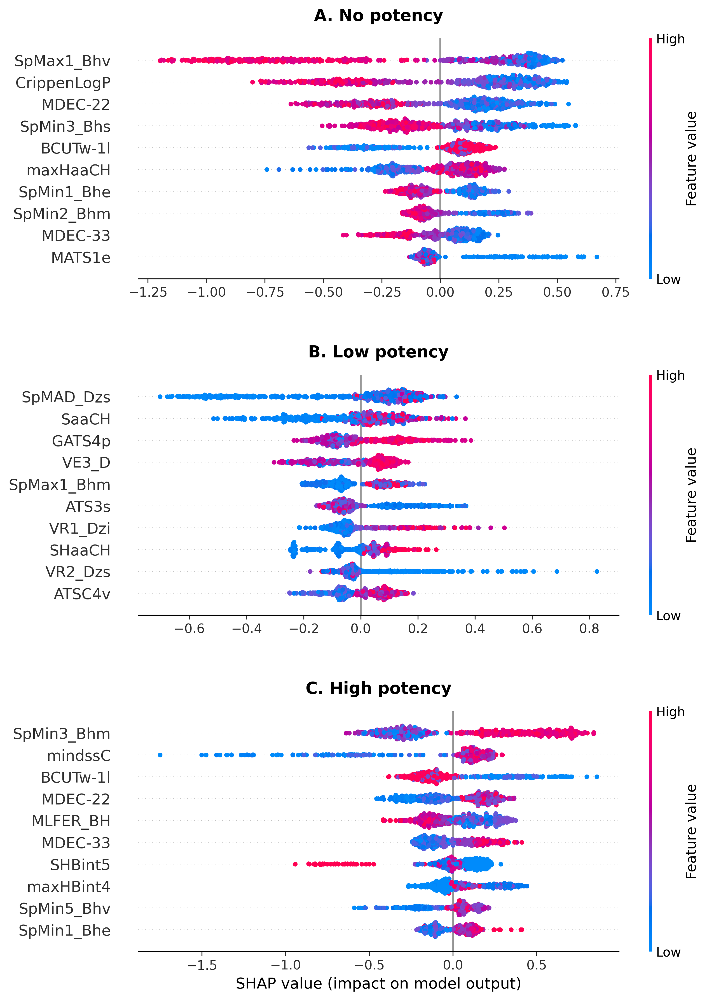

In [34]:
shap_values_class0 = shap_values[:, :, 0]  
shap_values_class1 = shap_values[:, :, 1]  
shap_values_class2 = shap_values[:, :, 2]  

my_classes = [shap_values_class0, shap_values_class1, shap_values_class2]
titles = ["A. No potency", "B. Low potency", "C. High potency"]

fig, axes = plt.subplots(3, 1, figsize=(9, 12), dpi=300)

for i, (ax, expl, title) in enumerate(zip(axes, my_classes, titles)):
    shap.plots.beeswarm(
        expl,
        max_display=10,
        group_remaining_features=False,
        show=False,
        plot_size=None,  
        ax=ax           
    )
    ax.set_title(title, loc="center", pad=15, fontweight="bold", fontsize=14)
    
    if i < len(axes) - 1:
        ax.set_xlabel("")  

plt.tight_layout()

plt.subplots_adjust(hspace=0.4)

plt.show()

## SHAP heatmap

In [35]:
df_ecfp_p = pickle.load( open( "df_heatmap_ec50.pkl", "rb" ) )

X = df_ecfp_p['smiles'].copy()
y = df_ecfp_p['y'].copy()
        
le = preprocessing.LabelEncoder()
le.fit(y)
y=le.transform(y)

cl_wght = compute_class_weight(class_weight="balanced", classes=np.unique(y), y=y)

class_weight = {i: cl_wght[i] for i in range(len(cl_wght))}

pipeline = Pipeline([
    ("auto2mol", AutoToMol()),                                  
    ("morgan3_2048", MolToMorganFP(n_bits=2048, radius=3)),        
    ("RandomForest", RandomForestClassifier(random_state=42, class_weight=class_weight))],
    n_jobs=4)

pipeline.fit(X, y)
    


,steps,"[('auto2mol', ...), ('morgan3_2048', ...), ...]"
,memory,None
,verbose,False
,n_jobs,4
,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'


### Functions

In [36]:
def plot_molecule_shap2(mol, pipeline=pipeline, pad=12, value_lims=None):

    explainer = SHAPTreeExplainer(pipeline)
    explanations = explainer.explain([mol], check_additivity=False)
    exp = explanations[0]

    atom_weights = exp.atom_weights

    if value_lims is None:
        local_min = atom_weights.min()
        local_max = atom_weights.max()
        local_abs = max(abs(local_min), abs(local_max))
        value_lims = [-local_abs, local_abs]

    canvas = mapvalues2mol(mol, atom_weights, value_lims=value_lims)
    img = transform2png(canvas.GetDrawingText())

    buf = io.BytesIO()
    img.save(buf, format="PNG")
    cropped = crop_to_content(buf.getvalue(), pad=pad)

    pred_class = pipeline.predict([mol])[0]
    proba = pipeline.predict_proba([mol])[0]
    confidence = proba[pred_class] * 100

    class_map = {
        1: "High potency",
        2: "Low potency",
        0: "No potency"
    }
    pred_label = class_map.get(pred_class, str(pred_class))

    fw = exp.feature_weights
    class_feat_shap = fw[:, pred_class].sum()

    return cropped, pred_label, confidence, class_feat_shap


def crop_to_content(png_bytes, pad=15, white_threshold=250):

    img = Image.open(io.BytesIO(png_bytes)).convert("RGBA")
    arr = np.asarray(img)
    alpha = arr[:, :, 3]
    rgb = arr[:, :, :3]

    content_mask = (alpha > 0) & (np.any(rgb < white_threshold, axis=2))

    if not content_mask.any():
        return img 

    ys, xs = np.where(content_mask)
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()

    x0 = max(x0 - pad, 0)
    y0 = max(y0 - pad, 0)
    x1 = min(x1 + pad, img.width - 1)
    y1 = min(y1 + pad, img.height - 1)

    return img.crop((x0, y0, x1 + 1, y1 + 1))



### Combined plot

In [37]:
df_simis = pd.read_csv('cb1_similarity_substances.csv', sep=";")

pretty_names = {
    "JWH_018": "JWH-018",
    "2_OH_indole_JWH_018": "2-OH indole JWH-018",
    "4_OH_indole_JWH_018": "4-OH indole JWH-018",
    "5_OH_indole_JWH_018": "5-OH indole JWH-018",
    "6_OH_indole_JWH_018": "6-OH indole JWH-018",
    "7_OH_indole_JWH_018": "7-OH indole JWH-018",
    "4_OH_pentyl_JWH_018" : "4-OH pentyl JWH-018", 
    "5_OH_pentyl_JWH_018" : "5-OH pentyl JWH-018", 
    "N_Pentanoic_acid_JWH_018" : "N-Pentanoic acid JWH-018",
    "THJ_2201": "THJ-2201", 
    "AM_2201" : "AM-2201", 
    "THJ_018" : "THJ-018"
}


In [38]:
mols = [Chem.MolFromSmiles(s) for s in df_simis["smiles"]]
for mol, name in zip(mols, df_simis["names"]):
    mol.SetProp("names", str(name))

explainer = SHAPTreeExplainer(pipeline)
explanations = explainer.explain(mols, check_additivity=False)

explanations_dict = {exp.molecule.GetProp("names"): exp for exp in explanations}

weight_min = min(exp.atom_weights.min() for exp in explanations_dict.values())
weight_max = max(exp.atom_weights.max() for exp in explanations_dict.values())
weight_abs_max = max(abs(weight_min), abs(weight_max))

weight_abs_max *= 0.70

global_limits = [-weight_abs_max, weight_abs_max]

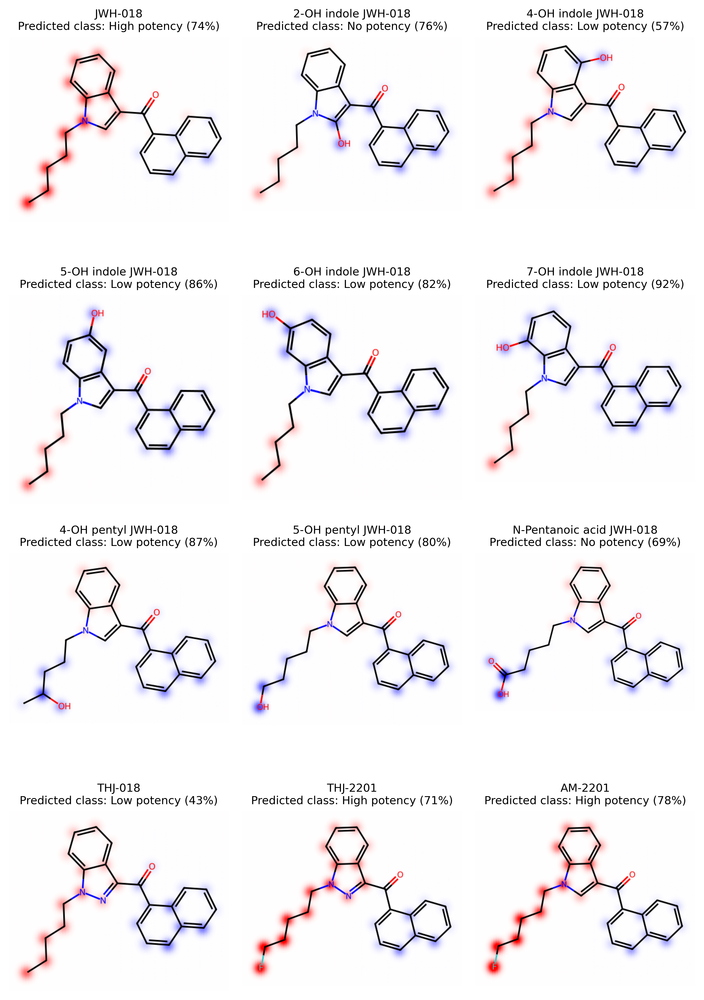

In [39]:
rotate = ["5_OH_pentyl_JWH_018", "N_Pentanoic_acid_JWH_018","THJ_2201", "AM_2201"]

mols = {} 
rot_y = np.array([[-1.,0.,0.,0.],[0.,1.,0.,0.],[0.,0.,-1.,0.],[0.,0.,0.,1.]])

for smi, name in zip(df_simis["smiles"], df_simis["names"]):
    mol = Chem.MolFromSmiles(smi)
    mol.SetProp("names", str(name))

    rdDepictor.Compute2DCoords(mol)

    if name in rotate:
        rdMolTransforms.TransformConformer(mol.GetConformer(0), rot_y)

    mols[name] = mol

imgs, preds, confs, feat_w = zip(*[plot_molecule_shap2(mols[name], pipeline, value_lims=global_limits) for name in df_simis["names"]])

fig, axes = plt.subplots(4, 3, figsize=(8, 12), dpi=400)
axes = axes.ravel()

for ax, img, name, pred, conf, feat_w  in zip(axes, imgs, df_simis["names"], preds, confs, feat_w ):
    ax.imshow(img)
    ax.axis("off")
    pretty = pretty_names.get(name, name) 
    ax.set_title(f"{pretty}\nPredicted class: {pred} ({conf:.0f}%)", fontsize=9, loc="center")
    ax.set_anchor("N")

plt.tight_layout()
plt.show()

# Ki vs EC50

In [40]:
df = pd.read_excel('ki_vs_ec50.xlsx')

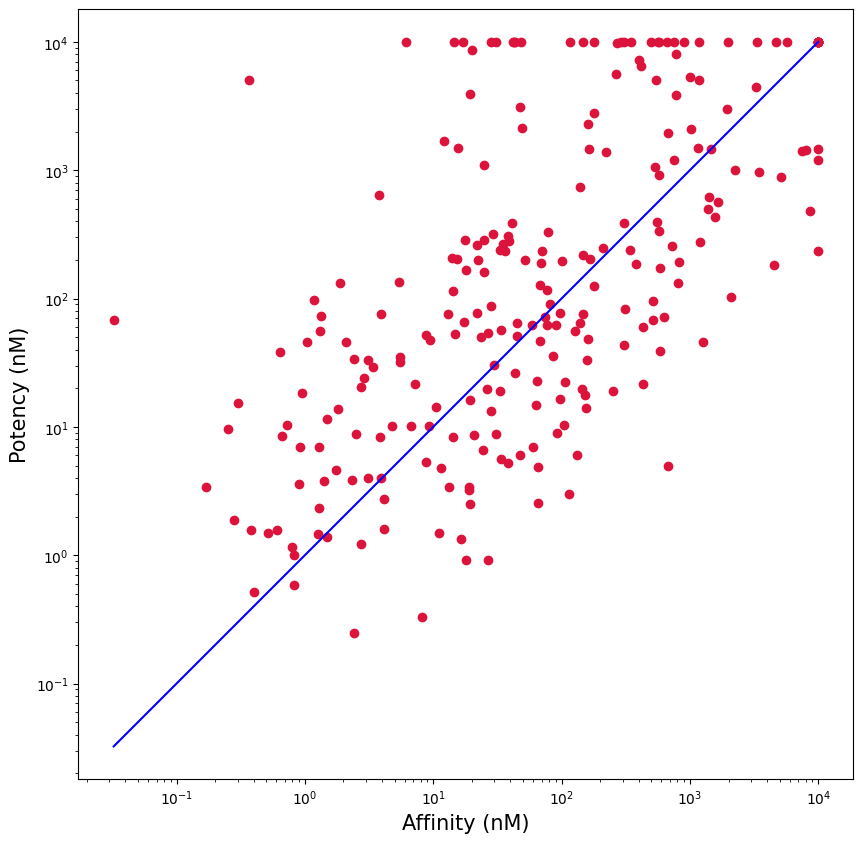

In [41]:
plt.figure(figsize=(10,10))
plt.scatter(df['Ki'], df['ec50'], c='crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(df['Ki']), max(df['ec50']))
p2 = min(min(df['Ki']), min(df['ec50']))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Affinity (nM)', fontsize=15)
plt.ylabel('Potency (nM)', fontsize=15)
plt.axis('equal')

plt.show()

## Stats

Both sample are not from a Gaussian distribution

To test for correlation, we used the Spearman test, as data are non-normal
The Spearman test showed a positive correlation (ρ = 0.62, p < 0.001), indicating that higher values of Ki are associated with higher values of EC50 on a monotonic scale, even without assuming normality of the data.

In [42]:
from scipy.stats import shapiro

stat, p = shapiro(df['Ki'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')
    
stat, p = shapiro(df['ec50'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.413, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.563, p=0.000
Sample does not look Gaussian (reject H0)


In [43]:
from scipy.stats import spearmanr

spearman_corr, spearman_p = spearmanr(df['Ki'], df['ec50'])

print(f"Spearman ρ = {spearman_corr:.3f}, p = {spearman_p:.3e}")

count = len(df['Ki'])

stderr = 1.0 / math.sqrt(count - 3)
delta = 1.96 * stderr
lower = math.tanh(math.atanh(spearman_corr) - delta)
upper = math.tanh(math.atanh(spearman_corr) + delta)

print(lower)
print(upper)

Spearman ρ = 0.633, p = 4.613e-29
0.5517888670124793
0.702339154416934
